# Data Processing

In [24]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.fft import fft, fftfreq
from scipy.signal import spectrogram
import os

In [25]:
path_to_data = "C:\\Users\\ryanz\\Documents\\CS528\\project\\IMU\\data"

data = {}

for filename in os.listdir(path_to_data):
    df = pd.read_csv(path_to_data + "\\" + filename)
    df = df.reset_index().rename(columns={'index': 'Sample Num'})

    data[filename[:-4]] = df



In [26]:
id_1 = 1
id_2 = 2

play_1 = data[f'sensor_data_play_{id_1}']
pause_1 = data[f'sensor_data_pause_{id_1}']
skip_1 = data[f'sensor_data_skip_{id_1}']
rewind_1 = data[f'sensor_data_rewind_{id_1}']

play_2 = data[f'sensor_data_play_{id_2}']
pause_2 = data[f'sensor_data_pause_{id_2}']
skip_2 = data[f'sensor_data_skip_{id_2}']
rewind_2 = data[f'sensor_data_rewind_{id_2}']



In [27]:
def plot_data(dataset, acc, word, unique_id):
    fig, axs = plt.subplots(1, figsize=(7, 5))
    if acc:
        sns.lineplot(ax=axs, x=dataset['Sample Num'], y=dataset['acc_x'], label='acc_x')
        sns.lineplot(ax=axs, x=dataset['Sample Num'], y=dataset['acc_y'], label='acc_y')
        sns.lineplot(ax=axs, x=dataset['Sample Num'], y=dataset['acc_z'], label='acc_z')
        axs.set_title(f'Acceleration of sensor_data_{word}_{unique_id}')
        axs.set(xlabel='Sample Number', ylabel='Acceleration')
        plt.tight_layout()
        plt.legend()
        plt.savefig(f"C:\\Users\\ryanz\\Documents\\CS528\\project\\IMU\\figures\\acceleration_{word}_{unique_id}.png")
        plt.show()
    else:
        sns.lineplot(ax=axs, x=dataset['Sample Num'], y=dataset['gyro_x'], label='gyro_x')
        sns.lineplot(ax=axs, x=dataset['Sample Num'], y=dataset['gyro_y'], label='gyro_y')
        sns.lineplot(ax=axs, x=dataset['Sample Num'], y=dataset['gyro_z'], label='gyro_z')
        axs.set_title(f'Angular Velocity of sensor_data_{word}_{unique_id}')
        axs.set(xlabel='Sample Number', ylabel='Angular Velocity')
        plt.tight_layout()
        plt.legend()
        plt.savefig(f"C:\\Users\\ryanz\\Documents\\CS528\\project\\IMU\\figures\\gyro_{word}_{unique_id}.png")
        plt.show()


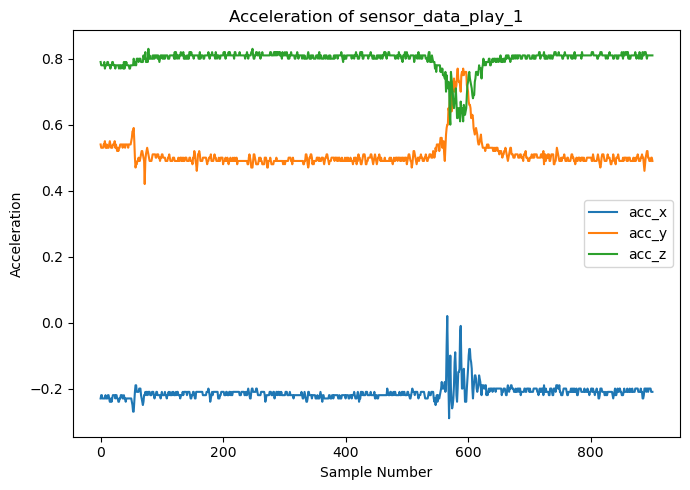

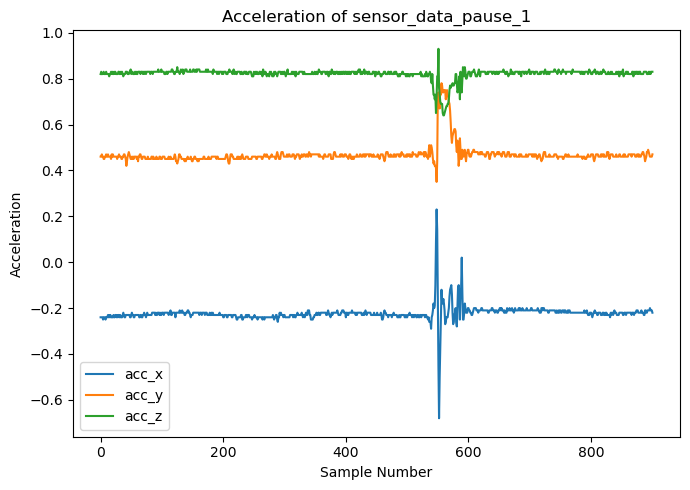

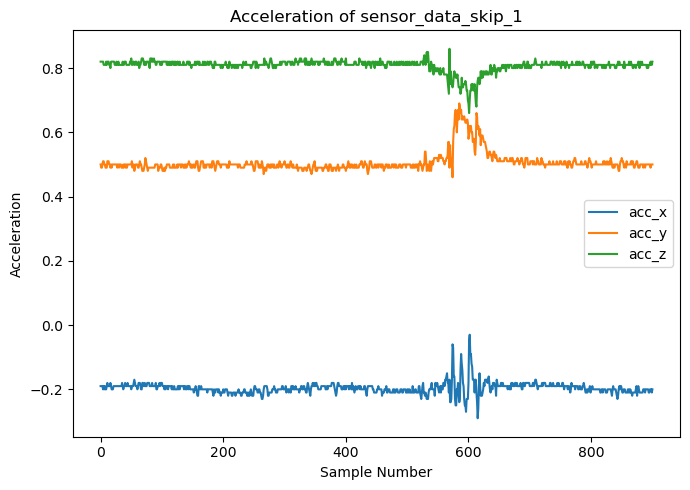

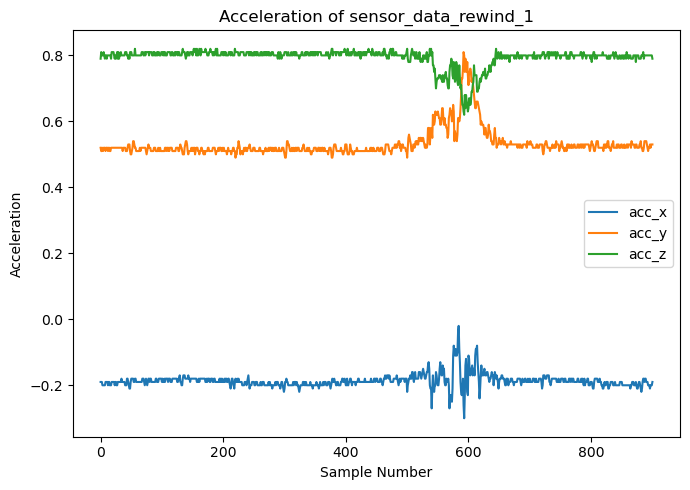

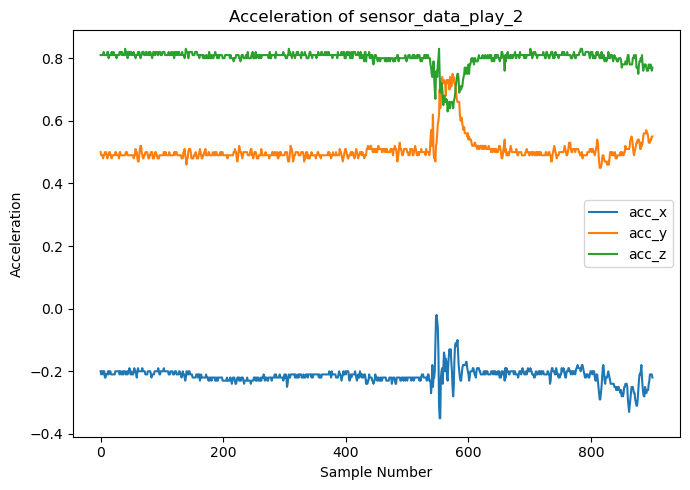

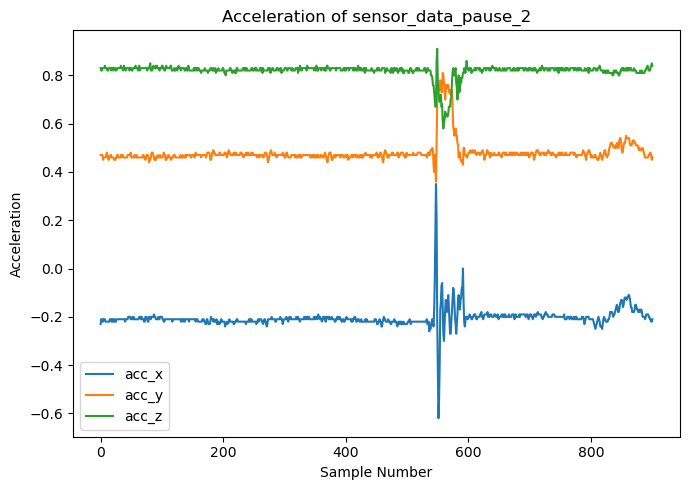

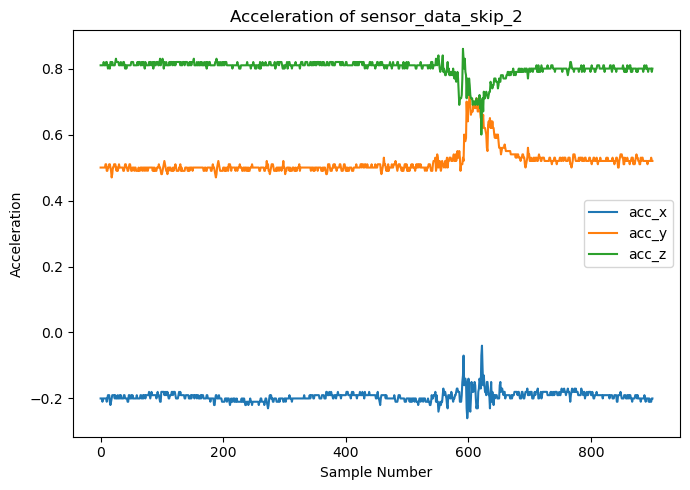

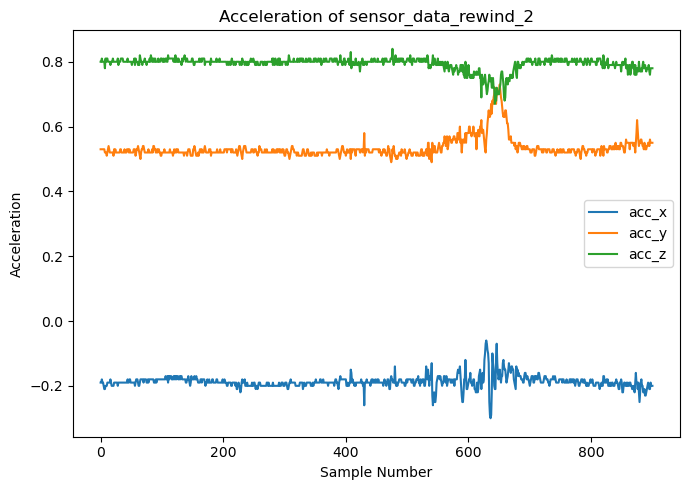

In [28]:

plot_data(play_1, True, 'play', id_1)
plot_data(pause_1, True, 'pause', id_1)
plot_data(skip_1, True, 'skip', id_1)
plot_data(rewind_1, True, 'rewind', id_1)
plot_data(play_2, True, 'play', id_2)
plot_data(pause_2, True, 'pause', id_2)
plot_data(skip_2, True, 'skip', id_2)
plot_data(rewind_2, True, 'rewind', id_2)

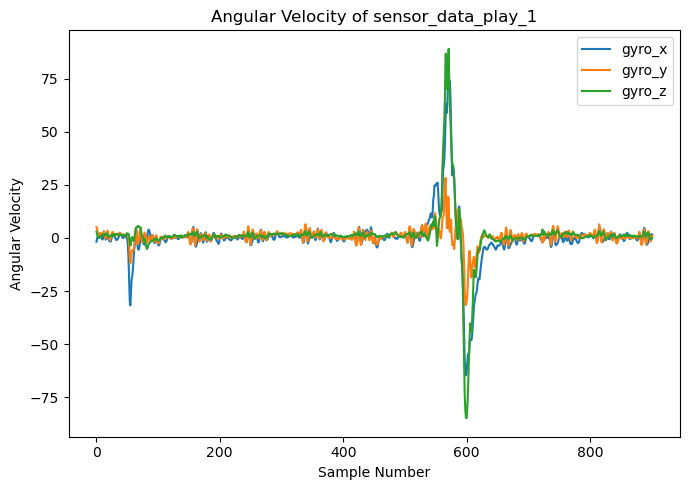

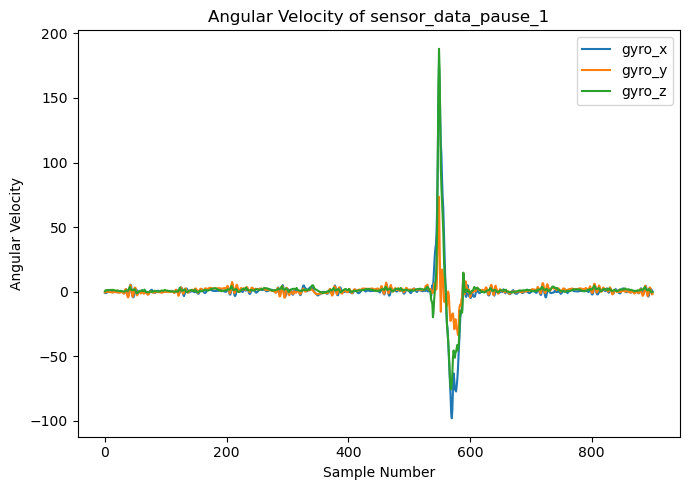

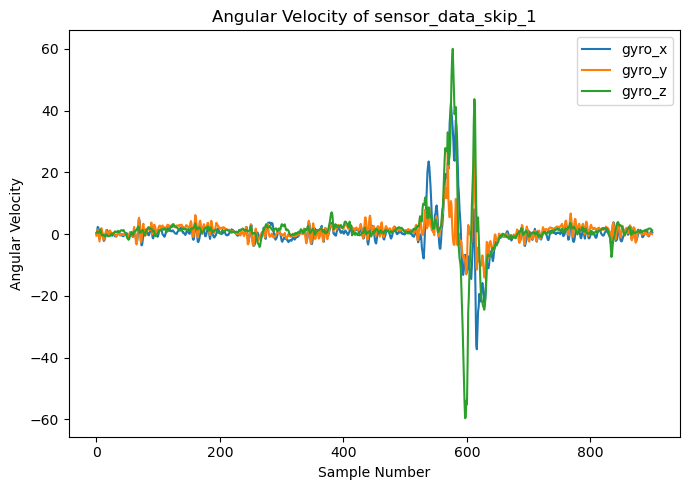

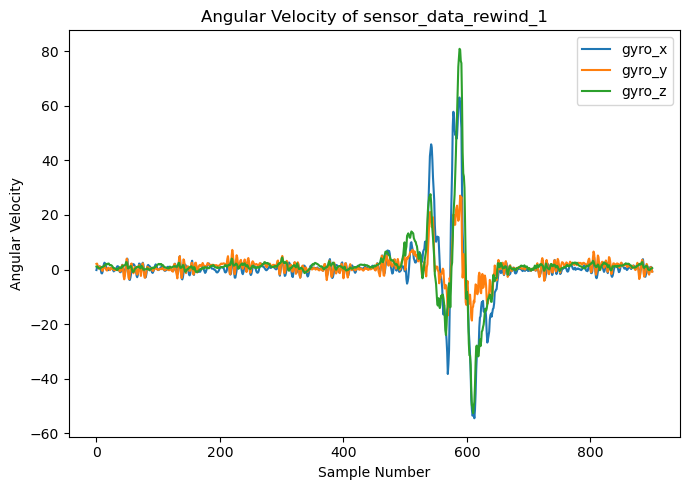

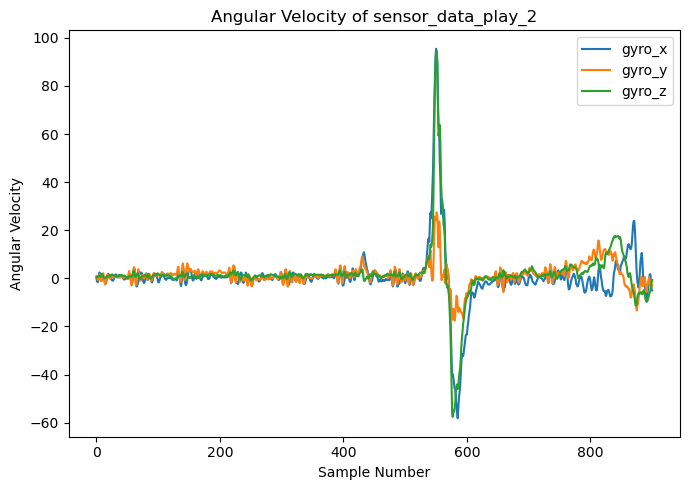

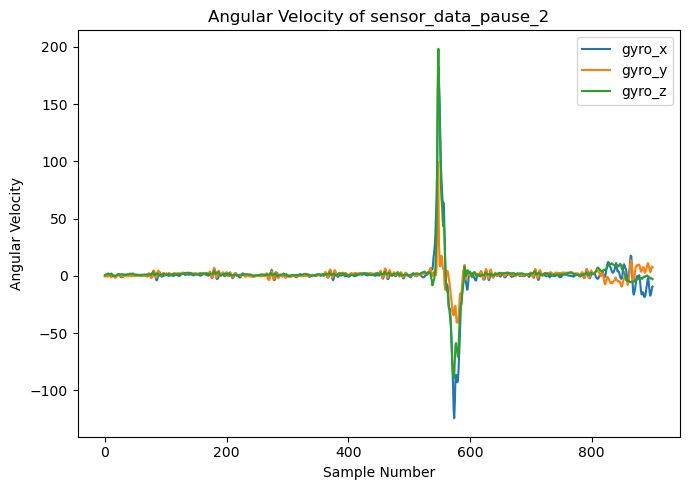

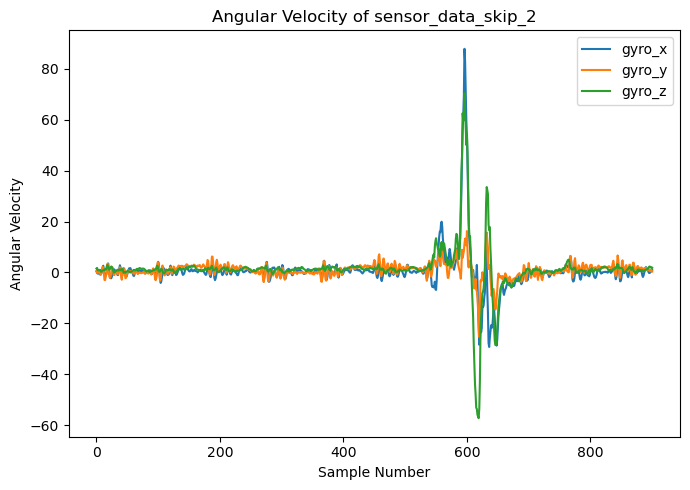

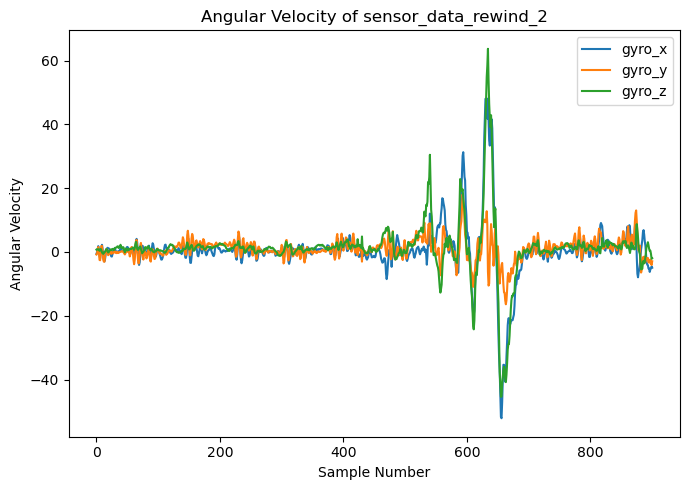

In [29]:
plot_data(play_1, False, 'play', id_1)
plot_data(pause_1, False, 'pause', id_1)
plot_data(skip_1, False, 'skip', id_1)
plot_data(rewind_1, False, 'rewind', id_1)
plot_data(play_2, False, 'play', id_2)
plot_data(pause_2, False, 'pause', id_2)
plot_data(skip_2, False, 'skip', id_2)
plot_data(rewind_2, False, 'rewind', id_2)

In [30]:
def plot_data(dataset, acc, word, unique_id):
    fig, axs = plt.subplots(1, figsize=(7, 5))
    if acc:
        sns.lineplot(ax=axs, x=dataset['Sample Num'], y=dataset['acc_x'], label='acc_x')
        sns.lineplot(ax=axs, x=dataset['Sample Num'], y=dataset['acc_y'], label='acc_y')
        sns.lineplot(ax=axs, x=dataset['Sample Num'], y=dataset['acc_z'], label='acc_z')
        axs.set_title(f'Acceleration of sensor_data_{word}_{unique_id}')
        axs.set(xlabel='Sample Number', ylabel='Acceleration')
        plt.tight_layout()
        plt.legend()
        plt.savefig(f"C:\\Users\\ryanz\\Documents\\CS528\\project\\IMU\\figures\\acceleration_{word}_{unique_id}.png")
        plt.show()
    else:
        sns.lineplot(ax=axs, x=dataset['Sample Num'], y=dataset['gyro_x'], label='gyro_x')
        sns.lineplot(ax=axs, x=dataset['Sample Num'], y=dataset['gyro_y'], label='gyro_y')
        sns.lineplot(ax=axs, x=dataset['Sample Num'], y=dataset['gyro_z'], label='gyro_z')
        axs.set_title(f'Angular Velocity of sensor_data_{word}_{unique_id}')
        axs.set(xlabel='Sample Number', ylabel='Angular Velocity')
        plt.tight_layout()
        plt.legend()
        plt.savefig(f"C:\\Users\\ryanz\\Documents\\CS528\\project\\IMU\\figures\\gyro_{word}_{unique_id}.png")
        plt.show()

def plot_spectrogram(dataset, acc, word, data_id):
    fig, axs = plt.subplots(1, 3, figsize=(21,7))
    plt_map = {
        "x": 0,
        "y": 1,
        "z": 2
    }
    data_dict = {}
    
    data_dict['x'] = dataset[f'{acc}_x']
    data_dict['y'] = dataset[f'{acc}_y']
    data_dict['z'] = dataset[f'{acc}_z']

    
    for axis in data_dict:
        data = data_dict[axis]
        axis_index = plt_map[axis]
        
        sampling_rate = data.shape[0] / 4
        segment_length = int(sampling_rate * .15)
        overlap = int(segment_length * .5)
        frequencies, times, Sxx = spectrogram(data, fs=sampling_rate, nperseg=segment_length, noverlap=overlap)
        
        pcm = axs[axis_index].pcolormesh(times, frequencies, 10 * np.log10(Sxx), shading='gouraud')
        axs[axis_index].set_ylabel('Frequency [Hz]')
        axs[axis_index].set_xlabel('Time [sec]')
        axs[axis_index].set_title(f'Spectrogram of {acc}_{axis} for sensor_data_{word}_{data_id}')

        
        plt.colorbar(pcm, ax=axs[axis_index], label='Intensity [dB]')

    plt.tight_layout()
    plt.legend()
    if acc == 'acc':
        plt.savefig(f"C:\\Users\\ryanz\\Documents\\CS528\\project\\IMU\\figures\\acceleration_spectro_{word}_{data_id}.png")
    else:
        plt.savefig(f"C:\\Users\\ryanz\\Documents\\CS528\\project\\IMU\\figures\\gyro_spectro_{word}_{data_id}.png")
    plt.show()


C:\Users\ryanz\AppData\Local\Temp\ipykernel_15776\2721391406.py:56: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


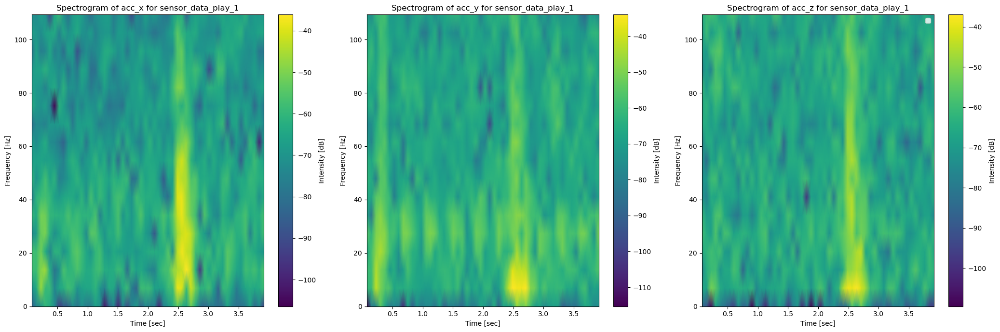

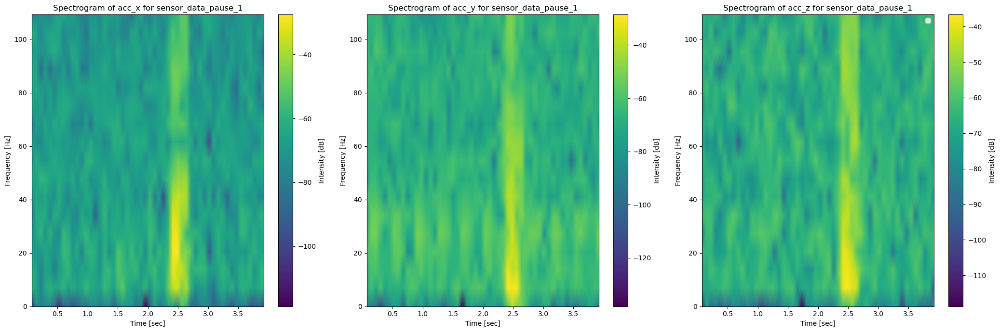

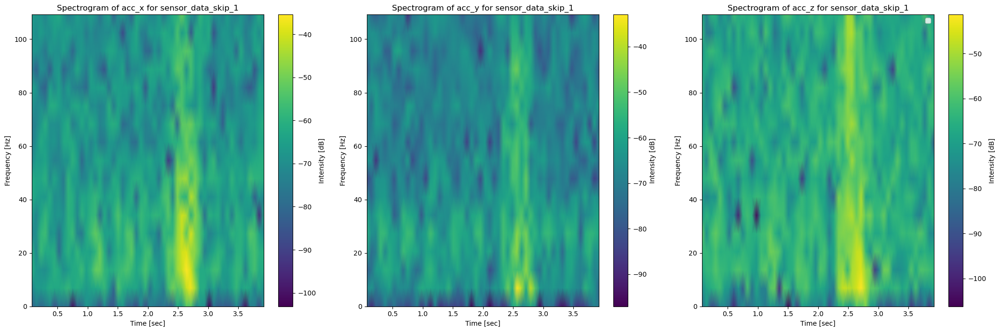

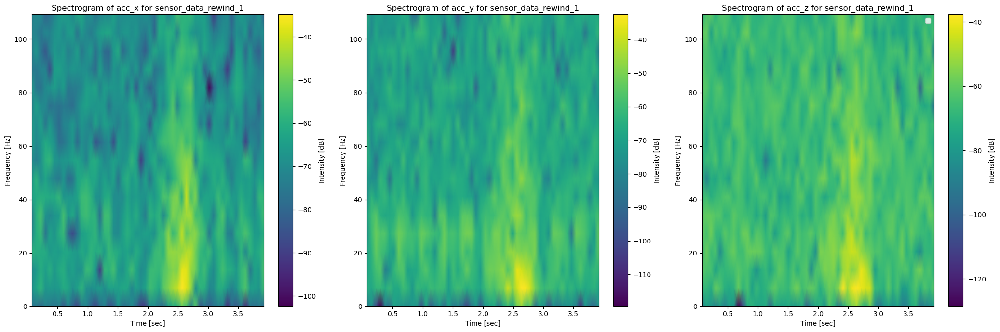

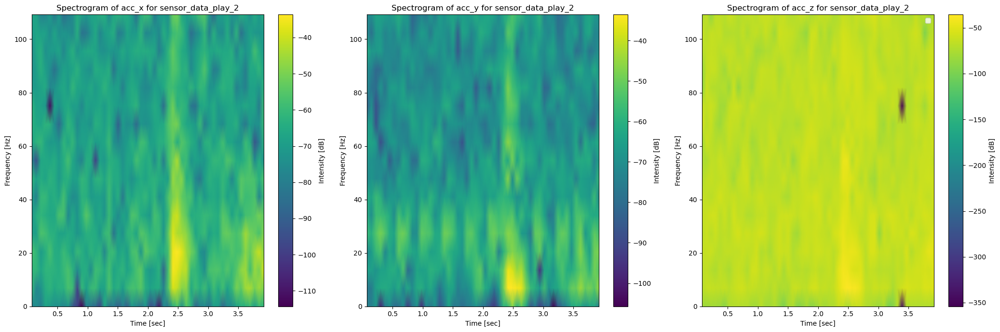

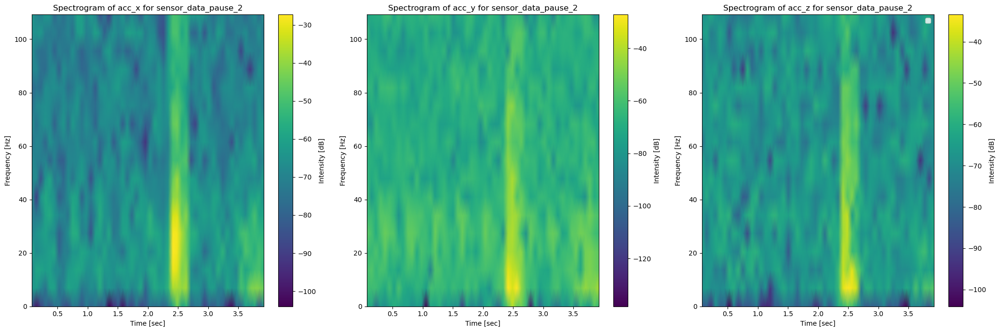

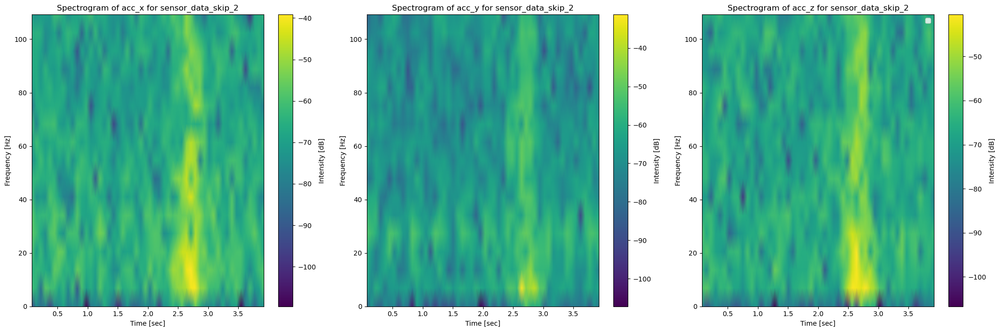

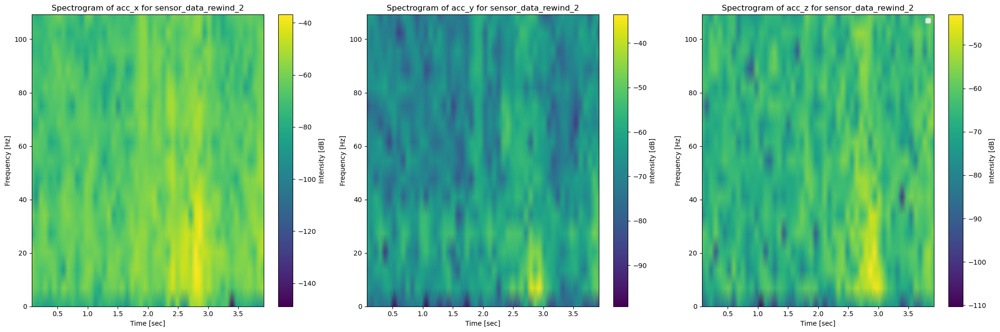

In [31]:
plot_spectrogram(play_1, 'acc', 'play', id_1)
plot_spectrogram(pause_1, 'acc', 'pause', id_1)
plot_spectrogram(skip_1, 'acc', 'skip', id_1)
plot_spectrogram(rewind_1, 'acc', 'rewind', id_1)
plot_spectrogram(play_2, 'acc', 'play', id_2)
plot_spectrogram(pause_2, 'acc', 'pause', id_2)
plot_spectrogram(skip_2, 'acc', 'skip', id_2)
plot_spectrogram(rewind_2, 'acc', 'rewind', id_2)

C:\Users\ryanz\AppData\Local\Temp\ipykernel_15776\2721391406.py:56: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


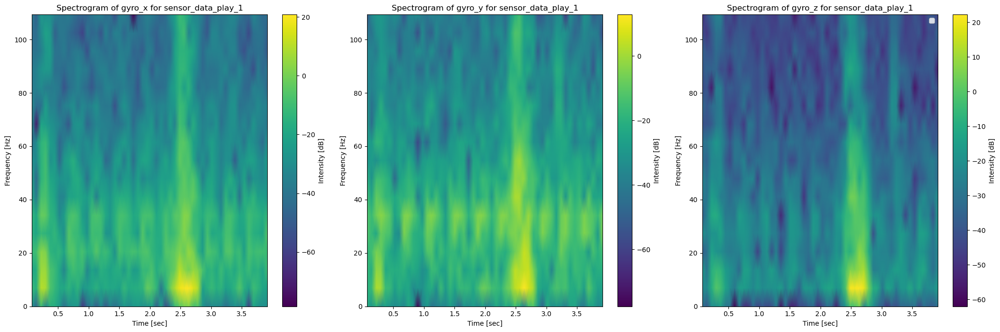

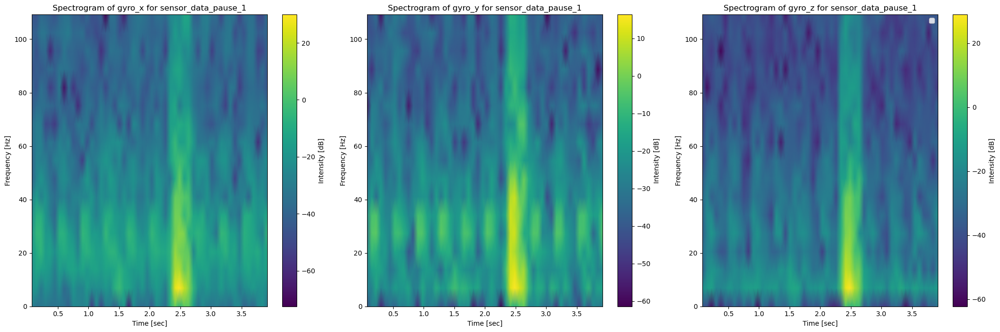

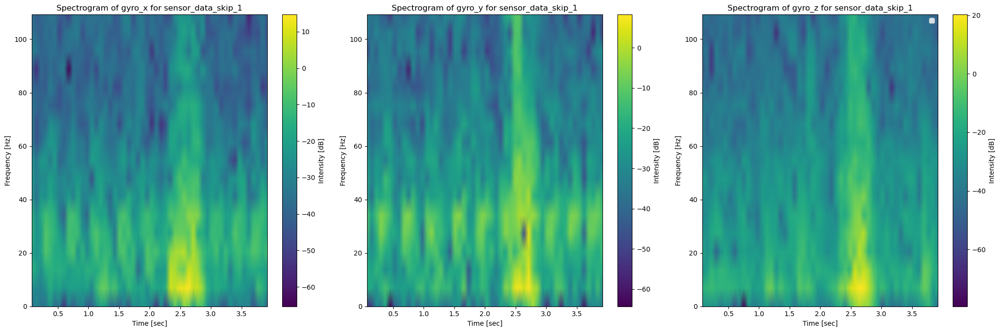

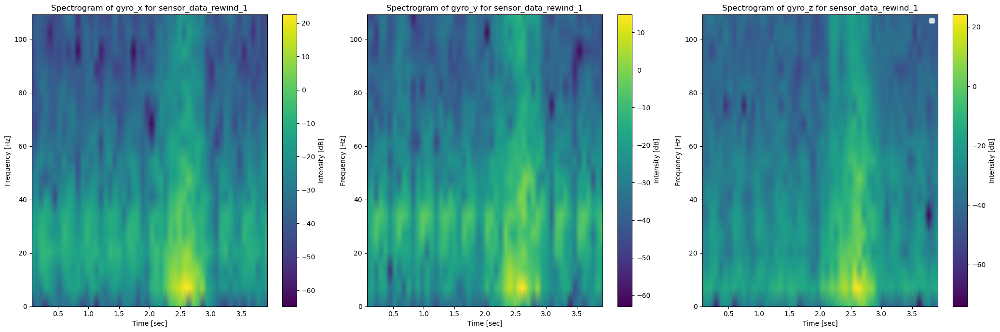

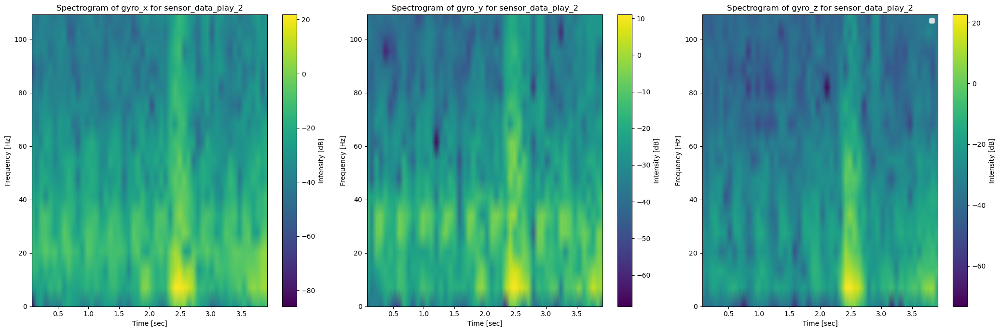

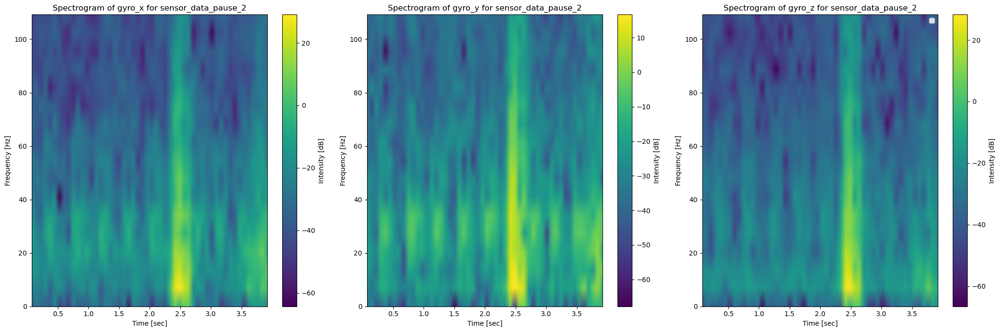

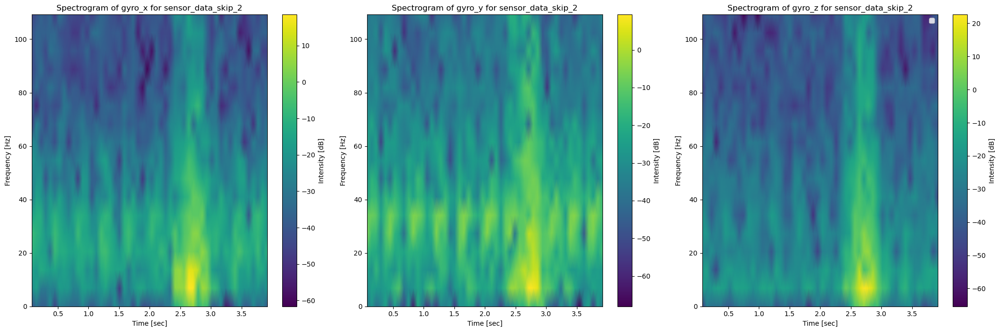

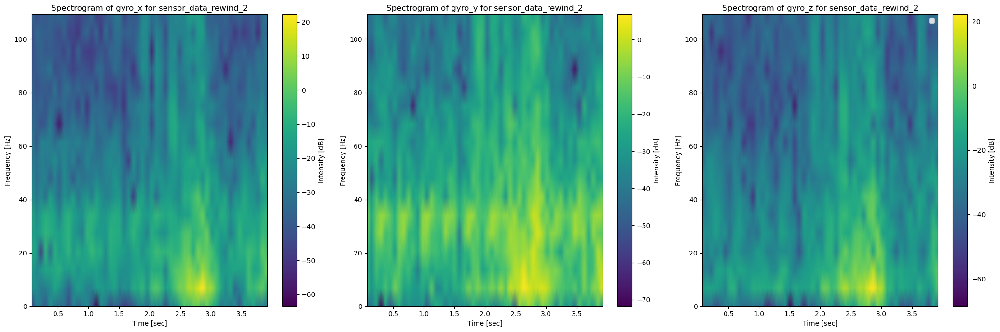

In [32]:
plot_spectrogram(play_1, 'gyro', 'play', id_1)
plot_spectrogram(pause_1, 'gyro', 'pause', id_1)
plot_spectrogram(skip_1, 'gyro', 'skip', id_1)
plot_spectrogram(rewind_1, 'gyro', 'rewind', id_1)
plot_spectrogram(play_2, 'gyro', 'play', id_2)
plot_spectrogram(pause_2, 'gyro', 'pause', id_2)
plot_spectrogram(skip_2, 'gyro', 'skip', id_2)
plot_spectrogram(rewind_2, 'gyro', 'rewind', id_2)